In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.preprocessing import StandardScaler

In [2]:
df=pd.read_csv('diabetes.csv')

In [3]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [4]:
df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [5]:
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [7]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [8]:
X=df.iloc[:,:-1]
y=df.iloc[:,-1]

In [9]:
print(X)
print(y)

     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0              6      148             72             35        0  33.6   
1              1       85             66             29        0  26.6   
2              8      183             64              0        0  23.3   
3              1       89             66             23       94  28.1   
4              0      137             40             35      168  43.1   
..           ...      ...            ...            ...      ...   ...   
763           10      101             76             48      180  32.9   
764            2      122             70             27        0  36.8   
765            5      121             72             23      112  26.2   
766            1      126             60              0        0  30.1   
767            1       93             70             31        0  30.4   

     DiabetesPedigreeFunction  Age  
0                       0.627   50  
1                       0.351   31  


In [10]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42);

In [11]:
print(X_train)

     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
60             2       84              0              0        0   0.0   
618            9      112             82             24        0  28.2   
346            1      139             46             19       83  28.7   
294            0      161             50              0        0  21.9   
231            6      134             80             37      370  46.2   
..           ...      ...            ...            ...      ...   ...   
71             5      139             64             35      140  28.6   
106            1       96            122              0        0  22.4   
270           10      101             86             37        0  45.6   
435            0      141              0              0        0  42.4   
102            0      125             96              0        0  22.5   

     DiabetesPedigreeFunction  Age  
60                      0.304   21  
618                     1.282   50  


In [12]:
print(y_train)

60     0
618    1
346    0
294    0
231    1
      ..
71     0
106    0
270    1
435    1
102    0
Name: Outcome, Length: 614, dtype: int64


In [13]:
st=StandardScaler()
X_train=st.fit_transform(X_train)
X_test=st.transform(X_test)

In [14]:
dt=DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=42)
dt.fit(X_train,y_train)
ypred=dt.predict(X_test)
ypred

array([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
      dtype=int64)

In [15]:
print('accuracy score for decision tree classifier',accuracy_score(y_test,ypred))

accuracy score for decision tree classifier 0.7922077922077922


In [16]:
print(confusion_matrix(y_test,ypred))


[[87 12]
 [20 35]]


In [17]:
cm=confusion_matrix(y_test,ypred)

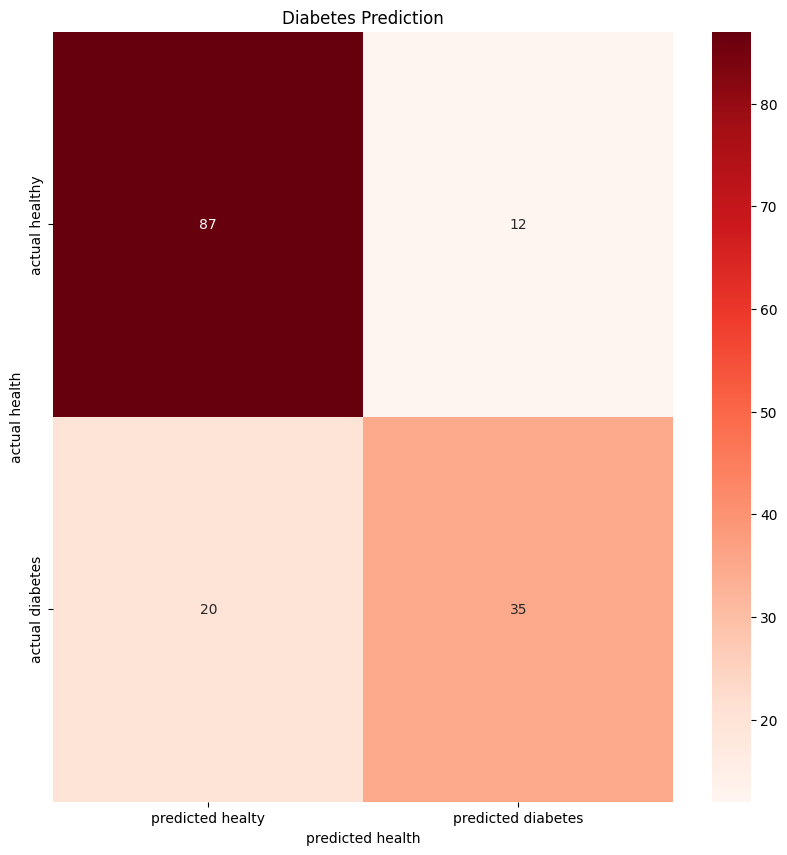

In [18]:
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, fmt='d',cmap='Reds',
xticklabels=['predicted healty','predicted diabetes'],
            yticklabels=['actual healthy','actual diabetes'])
plt.title('Diabetes Prediction')
plt.xlabel('predicted health')
plt.ylabel('actual health')
plt.show()

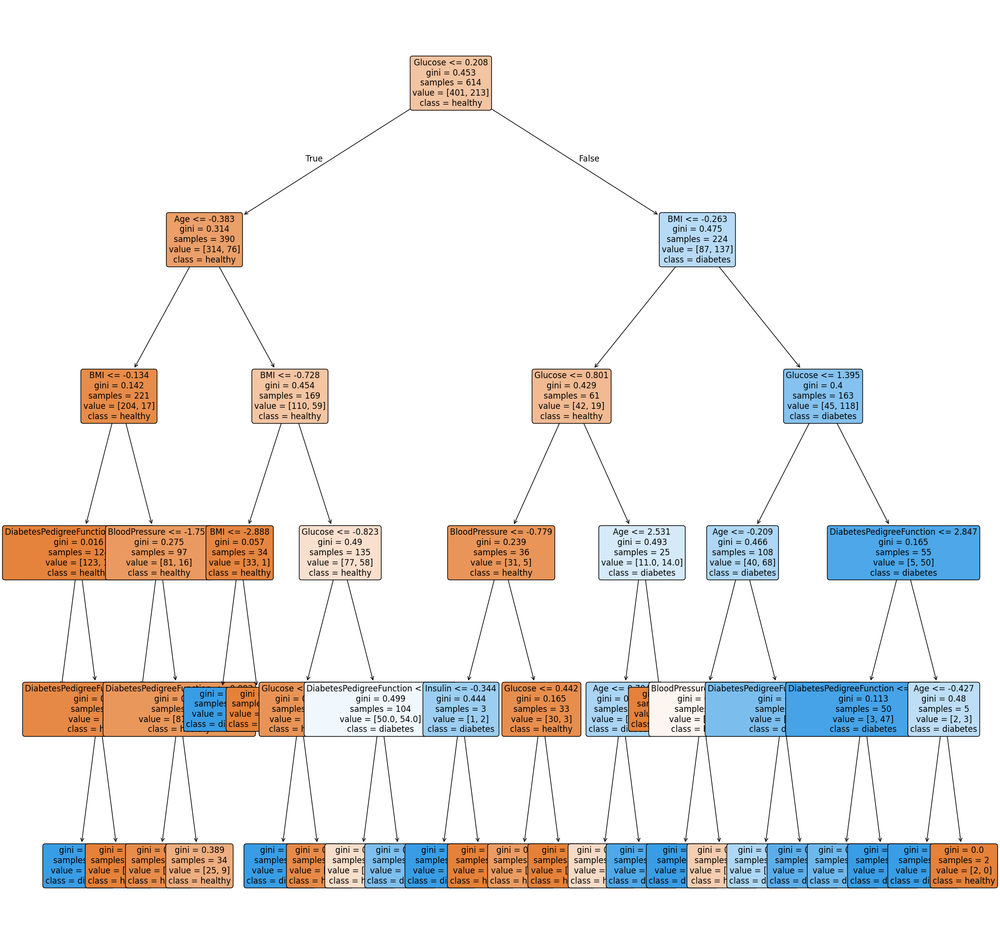

In [19]:
plt.figure(figsize=(25,25))
plot_tree(dt, feature_names=X.columns,filled=True, rounded=True, fontsize=12, class_names=['healthy','diabetes'])
plt.show()

In [20]:
from sklearn.ensemble import GradientBoostingClassifier

In [21]:
gb=GradientBoostingClassifier(n_estimators=100, learning_rate=0.2,max_depth=5,random_state=42)

In [22]:
gb.fit(X_train,y_train)
ypred=gb.predict(X_test)
print(ypred)

[1 0 0 0 0 1 0 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1 1 1 1 1 1 1
 1 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 1 1 0 0 1 0 1 0
 1 0 1 0 1 1 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0]


In [23]:
print('accuracy score for gradient boosting classifier',accuracy_score(y_test,ypred))

accuracy score for gradient boosting classifier 0.7402597402597403


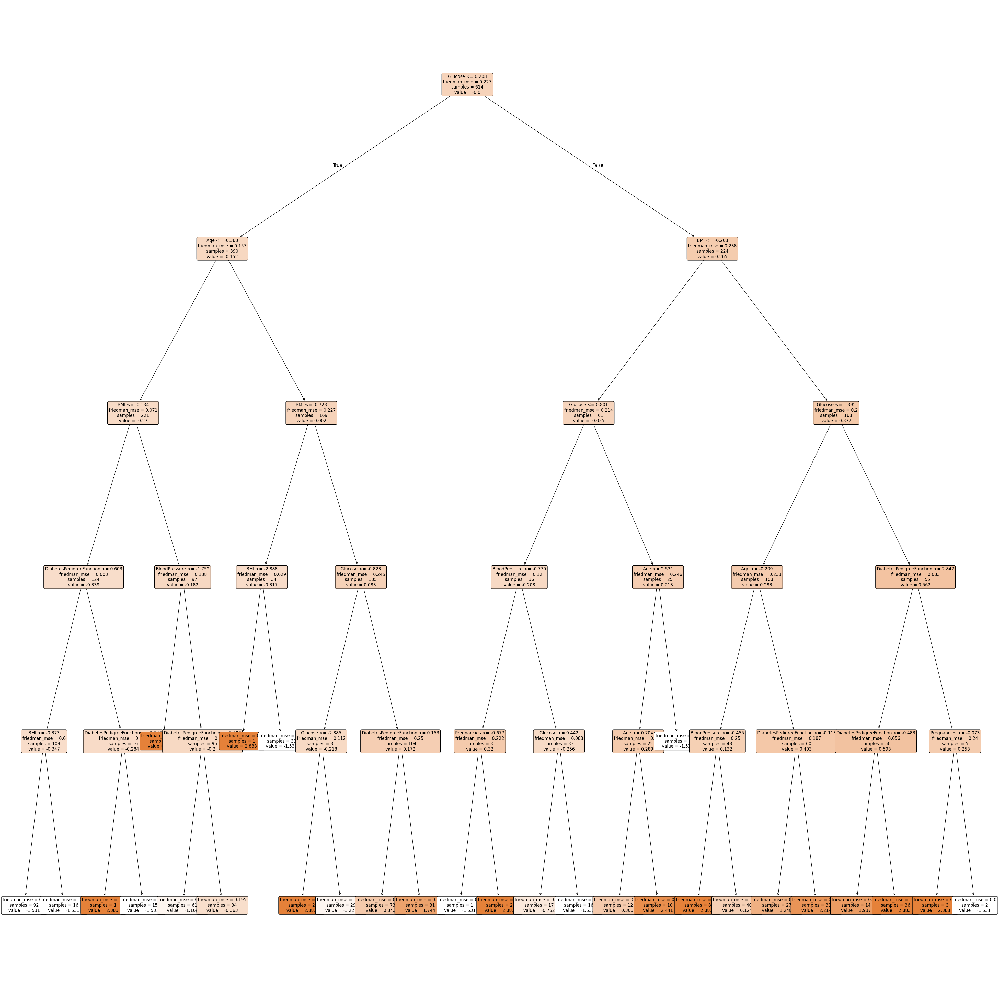

In [24]:
choosen_tree=gb.estimators_[0,0]
plt.figure(figsize=(50,50))
plot_tree(choosen_tree, feature_names=X.columns, filled=True, rounded=True, class_names=['healthy','diabetes'],
          fontsize=12)
plt.show()

In [25]:
from sklearn.ensemble import AdaBoostClassifier
ad=AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1),n_estimators=50,learning_rate=0.1,random_state=42)

In [26]:
ad.fit(X_train,y_train)
ypred=ad.predict(X_test)
print(ypred)

[0 0 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 1 1
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [27]:
print('accuracy score for adaboost classifier',accuracy_score(y_test,ypred))

accuracy score for adaboost classifier 0.7792207792207793


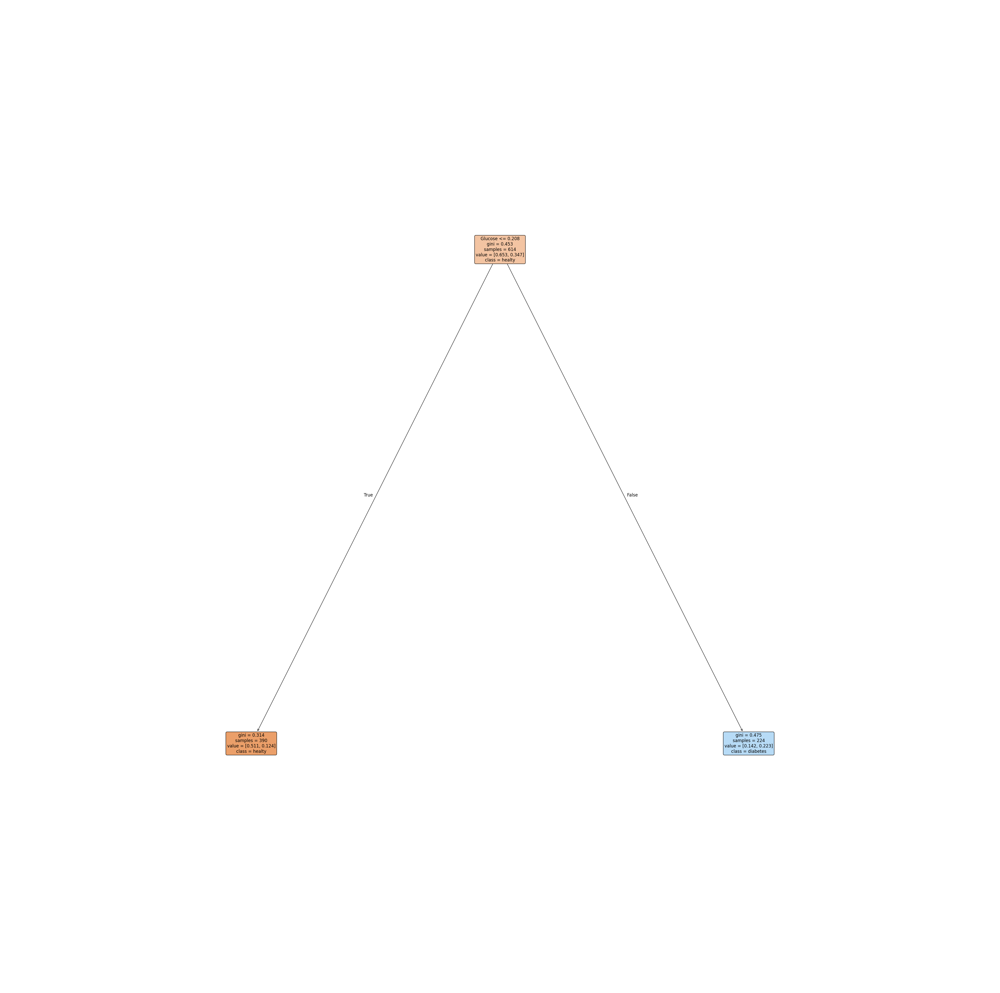

In [28]:
choosen_tree=ad.estimators_[0]
plt.figure(figsize=(50,50))
plot_tree(choosen_tree, feature_names=X.columns, filled=True, rounded=True, class_names=['healty','diabetes'],
          fontsize=12)
plt.show()

In [29]:
#bagging

In [30]:
rfc=RandomForestClassifier(n_estimators=50,criterion='entropy',random_state=42)
yf=rfc.fit(X_train,y_train)
y_pred=yf.predict(X_test)
y_pred


array([0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
      dtype=int64)

In [31]:
print('accuracy score for random forest',accuracy_score(y_test,y_pred))

accuracy score for random forest 0.7662337662337663


In [32]:
print(confusion_matrix(y_test,y_pred))

[[81 18]
 [18 37]]


In [33]:
cm=confusion_matrix(y_test,y_pred)

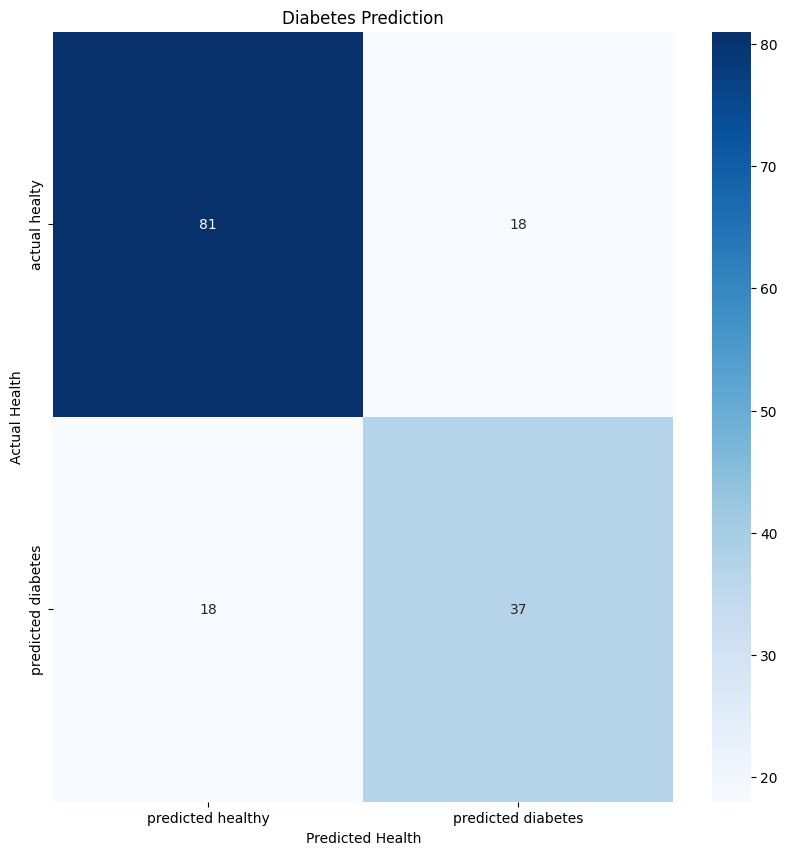

In [34]:
plt.figure(figsize=(10,10))
sns.heatmap(cm,annot=True,fmt='d',cmap='Blues',
            xticklabels=['predicted healthy','predicted diabetes'],
            yticklabels=['actual healty','predicted diabetes'])
plt.title('Diabetes Prediction')
plt.xlabel('Predicted Health')
plt.ylabel('Actual Health')
plt.show()

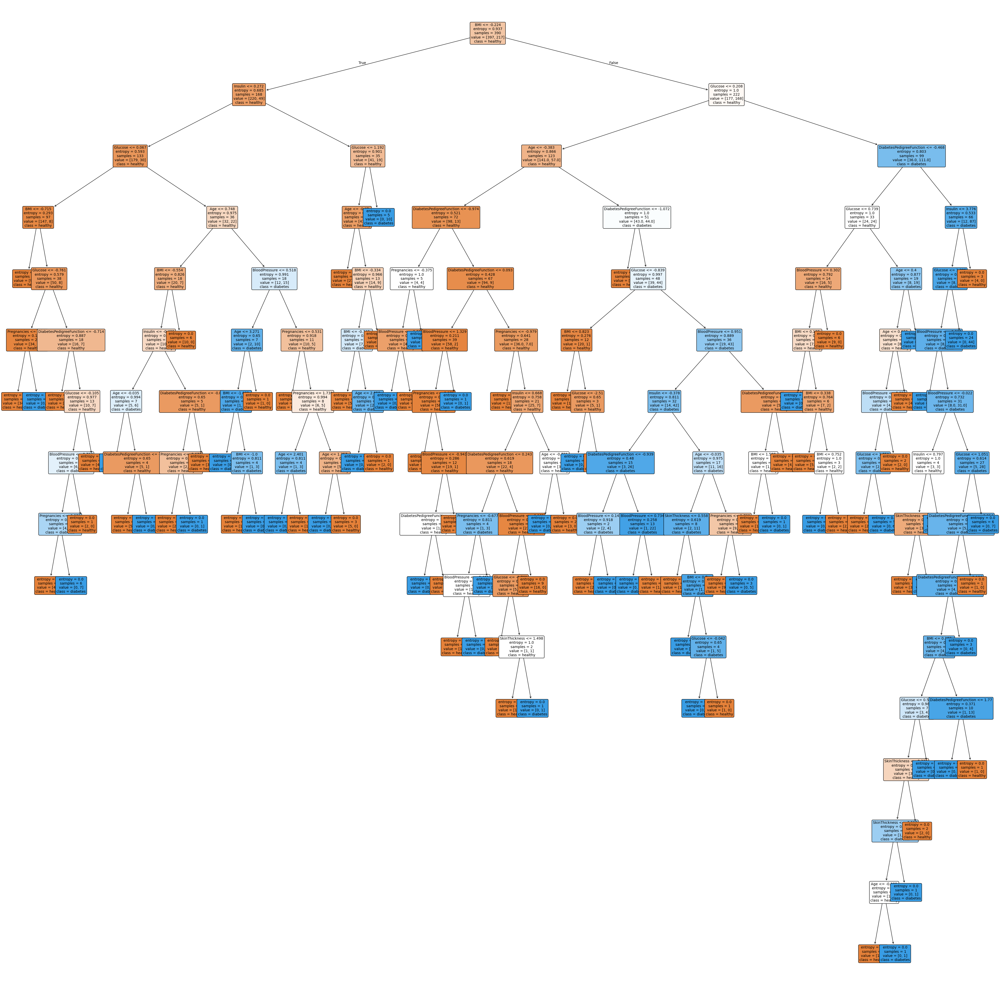

In [35]:
chosen_tree=rfc.estimators_[0]
plt.figure(figsize=(50,50))
plot_tree(chosen_tree,feature_names=X.columns,filled=True ,rounded=True,class_names=['healthy','diabetes'],
            fontsize=10)
plt.show()

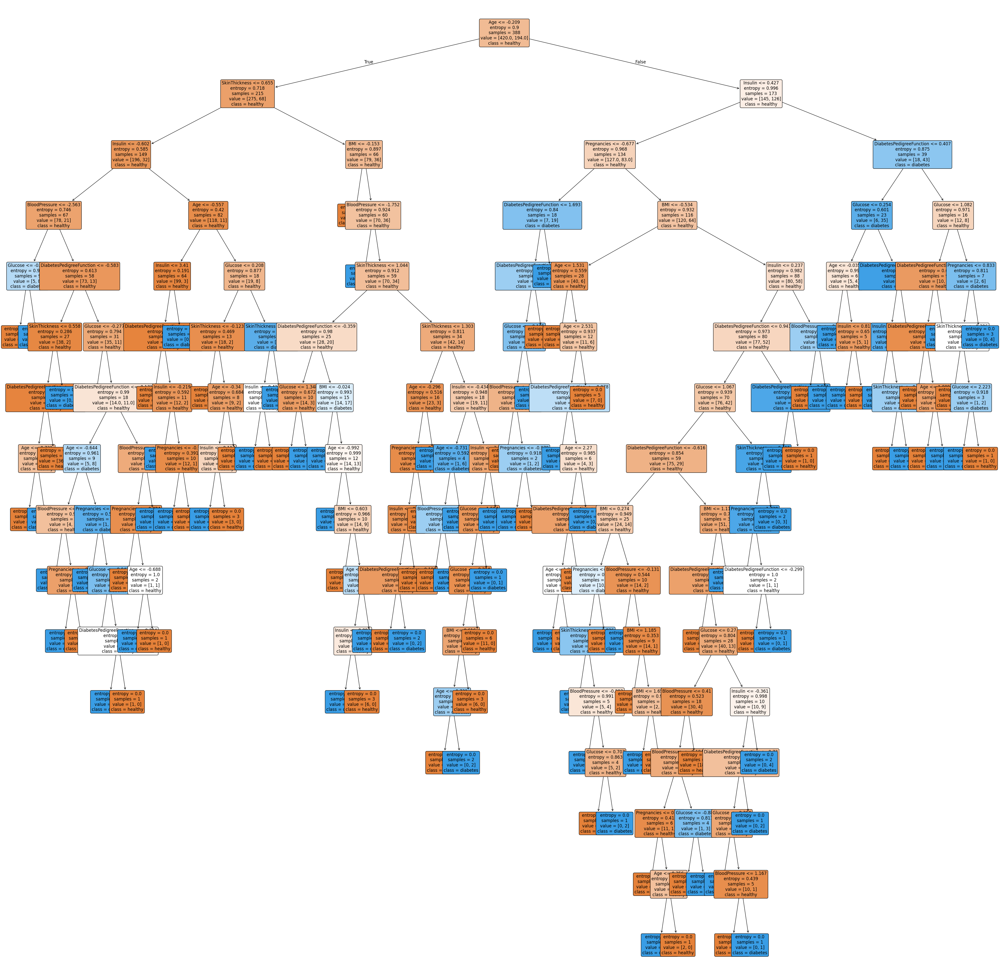

In [36]:
choosen_tree=rfc.estimators_[1]
plt.figure(figsize=(50,50))
plot_tree(choosen_tree, feature_names=X.columns,filled=True, rounded=True,class_names=['healthy','diabetes'],
          fontsize=12)
plt.show()

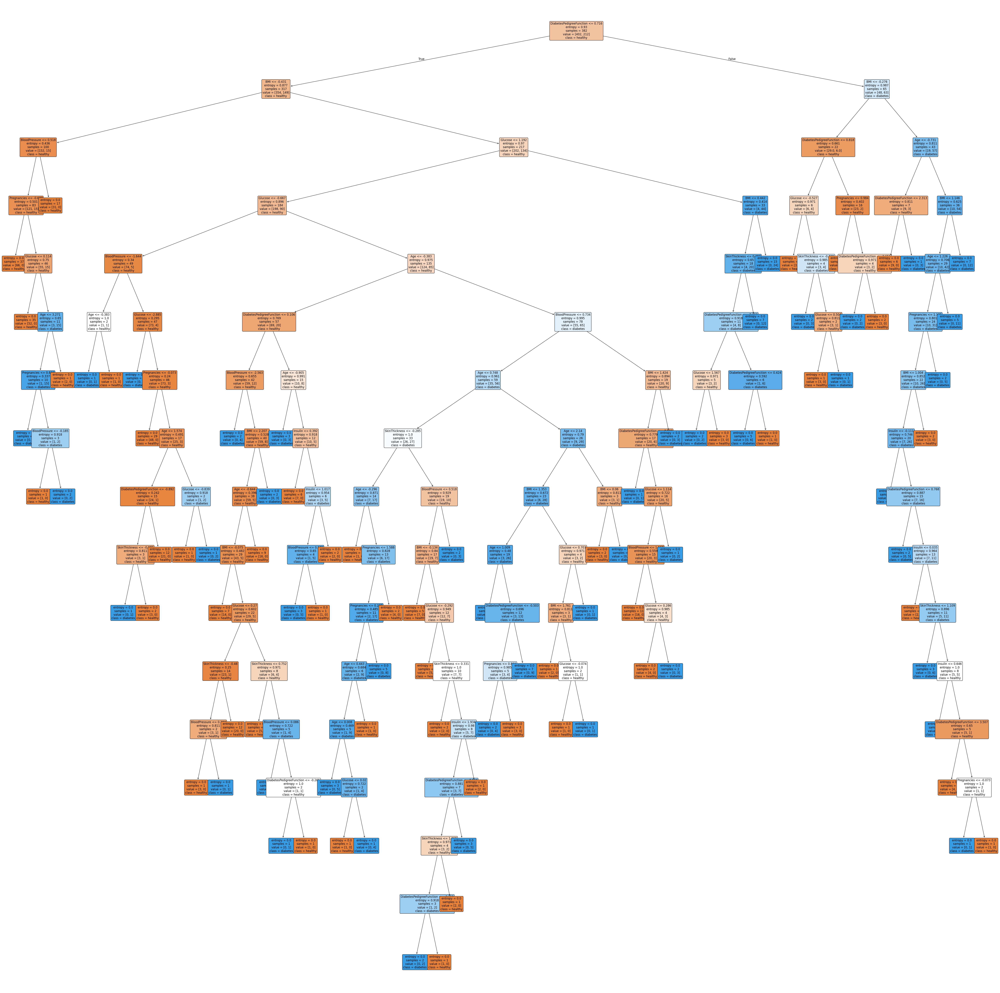

In [37]:
choosen_tree=rfc.estimators_[2]
plt.figure(figsize=(75,75))
plot_tree(choosen_tree,feature_names=X.columns,filled=True,rounded=True,class_names=['healthy','diabetes'],
          fontsize=12)
plt.show()

In [38]:
from sklearn.ensemble import BaggingClassifier
base_estimator=DecisionTreeClassifier()

In [39]:
bc=BaggingClassifier(estimator=base_estimator,n_estimators=10,max_samples=0.8,random_state=42)

In [40]:
bc.fit(X_train,y_train)
ypred=bc.predict(X_test)
print(ypred)

[0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 1 1 1 1
 1 0 1 0 0 1 1 0 1 0 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [41]:
print('accuracy score for bagging classifier',accuracy_score(y_test,ypred))

accuracy score for bagging classifier 0.7662337662337663


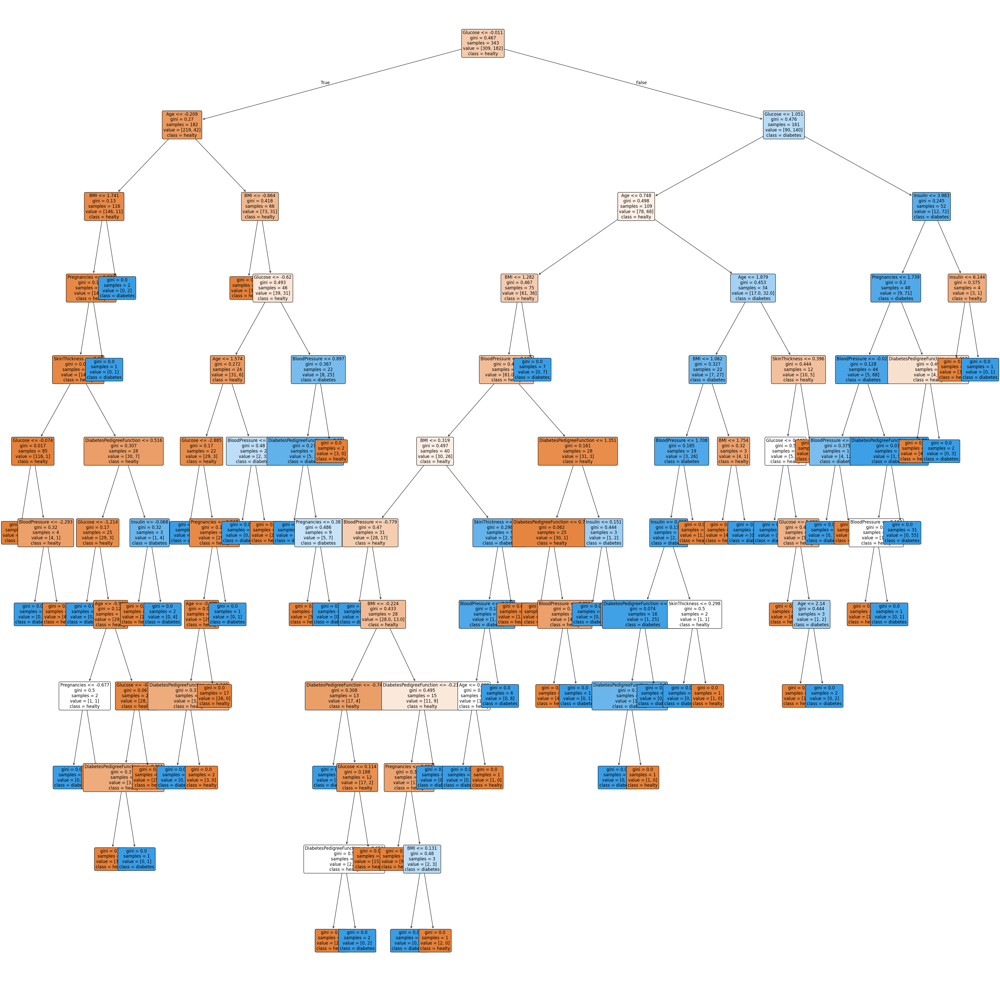

In [42]:
choosen_tree=bc.estimators_[0]
plt.figure(figsize=(50,50))
plot_tree(choosen_tree, feature_names=X.columns, filled=True, rounded=True, class_names=['healty','diabetes'],
          fontsize=12)
plt.show()

In [43]:
#PCA

In [44]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

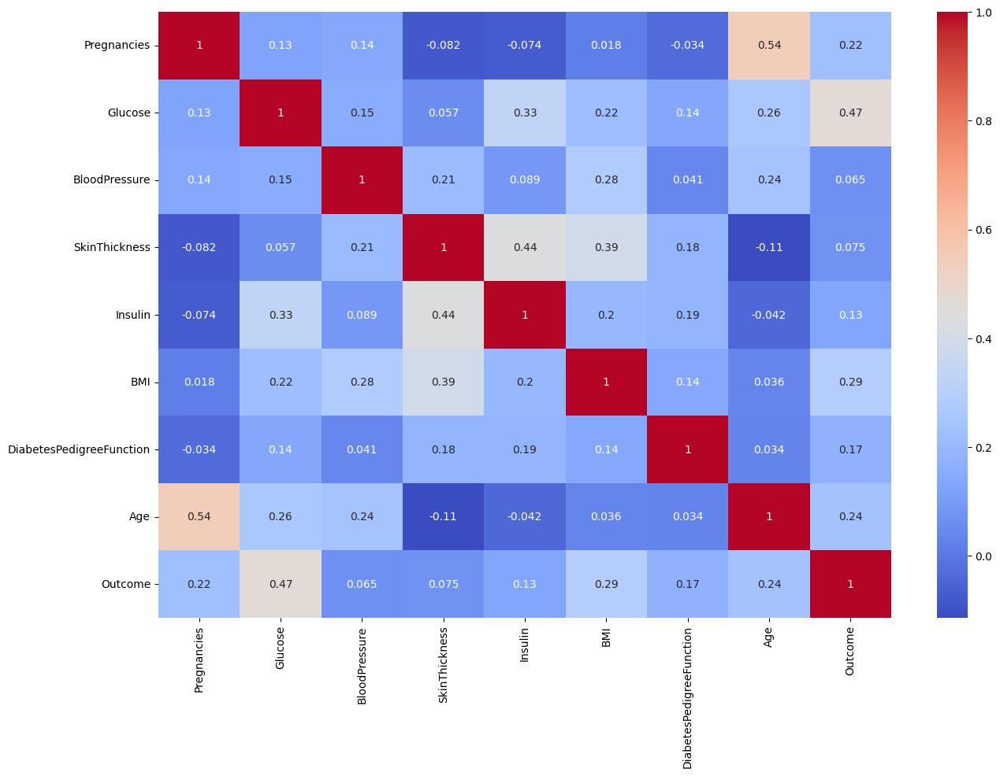

In [45]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')
plt.show()

In [46]:
df1=df[['BloodPressure','Glucose','Insulin','Age']]

In [47]:
df1.head(10)

,BloodPressure,Glucose,Insulin,Age
0,72,148,0,50
1,66,85,0,31
2,64,183,0,32
3,66,89,94,21
4,40,137,168,33
5,74,116,0,30
6,50,78,88,26
7,0,115,0,29
8,70,197,543,53
9,96,125,0,54


In [48]:
df1.isna().sum()

BloodPressure    0
Glucose          0
Insulin          0
Age              0
dtype: int64

#diabetes range for glucose 140 to 190, Insulin 25

In [49]:
df2=df1['outcome']=df1.apply(lambda x: 1 if x['Glucose']>=140 or x['Insulin']>=25 else 0, axis=1)
print(df2)

0      1
1      0
2      1
3      1
4      1
      ..
763    1
764    0
765    1
766    0
767    0
Length: 768, dtype: int64


C:\Users\tonyr\AppData\Local\Temp\ipykernel_25376\678603551.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2=df1['outcome']=df1.apply(lambda x: 1 if x['Glucose']>=140 or x['Insulin']>=25 else 0, axis=1)


In [50]:
df1.head(30)

,BloodPressure,Glucose,Insulin,Age,outcome
0,72,148,0,50,1
1,66,85,0,31,0
2,64,183,0,32,1
3,66,89,94,21,1
4,40,137,168,33,1
5,74,116,0,30,0
6,50,78,88,26,1
7,0,115,0,29,0
8,70,197,543,53,1
9,96,125,0,54,0


In [51]:
X=df1.iloc[:,:-1].values
y=df1.iloc[:,-1].values

In [52]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [53]:
df1.describe()

,BloodPressure,Glucose,Insulin,Age,outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000
mean,69.105469,120.894531,79.799479,33.240885,0.619792
std,19.355807,31.972618,115.244002,11.760232,0.485754
min,0.000000,0.000000,0.000000,21.000000,0.000000
25%,62.000000,99.000000,0.000000,24.000000,0.000000
50%,72.000000,117.000000,30.500000,29.000000,1.000000
75%,80.000000,140.250000,127.250000,41.000000,1.000000
max,122.000000,199.000000,846.000000,81.000000,1.000000


In [54]:
sd=StandardScaler()
X_train=sd.fit_transform(X_train)
X_test=sd.transform(X_test)

In [55]:
dt=DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=42)

In [56]:
dt.fit(X_train,y_train)
ypred=dt.predict(X_test)

In [57]:
print(ypred)

[1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1 1 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1
 0 0 0 1 0 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 0 0 0 1 1 0 0 1
 0 0 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 0 0 0 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 0 0
 1 0 1 1 0 1 0 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1 1 1 0 0 1 1 0 0 0 0 1 0 0 0 0
 0 1 1 0 1 1]


In [58]:
print(accuracy_score(y_test,ypred))

1.0


In [59]:
print(confusion_matrix(y_test,ypred))

[[64  0]
 [ 0 90]]


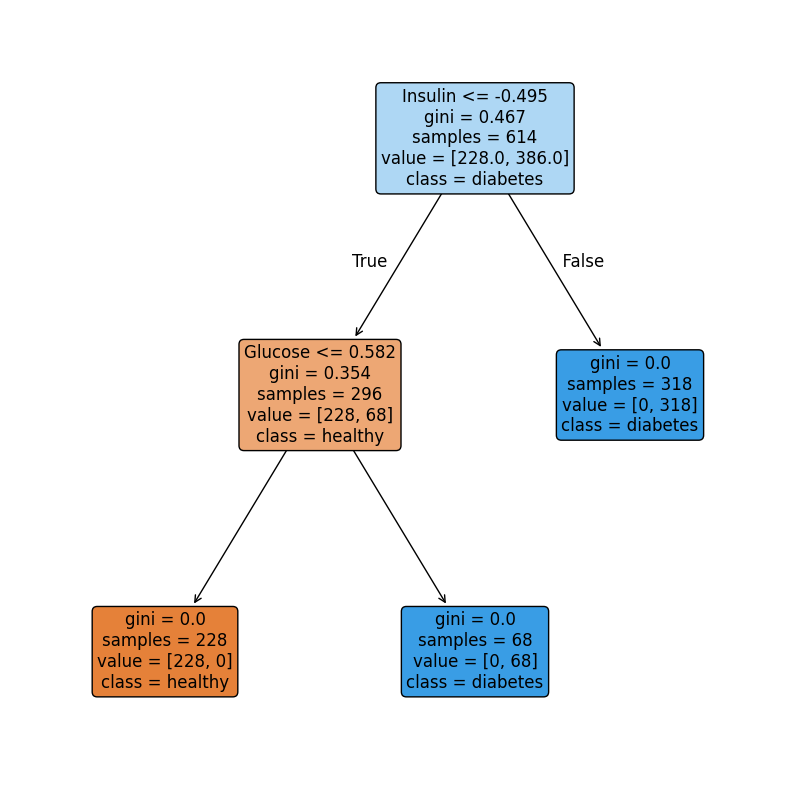

In [60]:
X=df[['BloodPressure','Glucose','Insulin','Age']]
plt.figure(figsize=(10,10))
plot_tree(dt,feature_names=X.columns, filled=True, rounded=True, class_names=['healthy','diabetes'],fontsize=12 )
plt.show()

In [61]:
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

In [62]:
X=df[['Glucose','BloodPressure','Insulin','Age']].values
y=df.iloc[:,-1].values

In [63]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [64]:
scaler=StandardScaler()
scaler_data=scaler.fit_transform(X_train)
scaler_data1=scaler.transform(X_test)

In [65]:
pca=PCA(n_components=2)
pca_data=pca.fit_transform(scaler_data)
pca_data1=pca.transform(scaler_data1)

In [66]:
print(pca_data)

[[-3.21472582  1.23103637]
 [ 0.55013979 -1.64684153]
 [-0.66730723  1.15013599]
 ...
 [-0.06284539 -1.21984621]
 [-1.76996766  1.25386619]
 [-0.05115164 -0.41458404]]


In [67]:
rtf=RandomForestClassifier(n_estimators=150,criterion='entropy',random_state=42)

In [68]:
rtf.fit(pca_data,y_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",150
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'entropy'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `met

In [69]:
ypred=rtf.predict(pca_data1)

In [70]:
print(ypred)

[0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1 0 0 1 0 1 1 0 1 1
 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 0 0 0
 0 0 0 0 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 1 1 0 0 0 0]


In [71]:
print(accuracy_score(y_test,ypred))

0.7207792207792207


In [72]:
print(confusion_matrix(y_test,ypred))

[[79 20]
 [23 32]]


In [73]:
X=df[['Glucose','BloodPressure','Insulin','Age']]

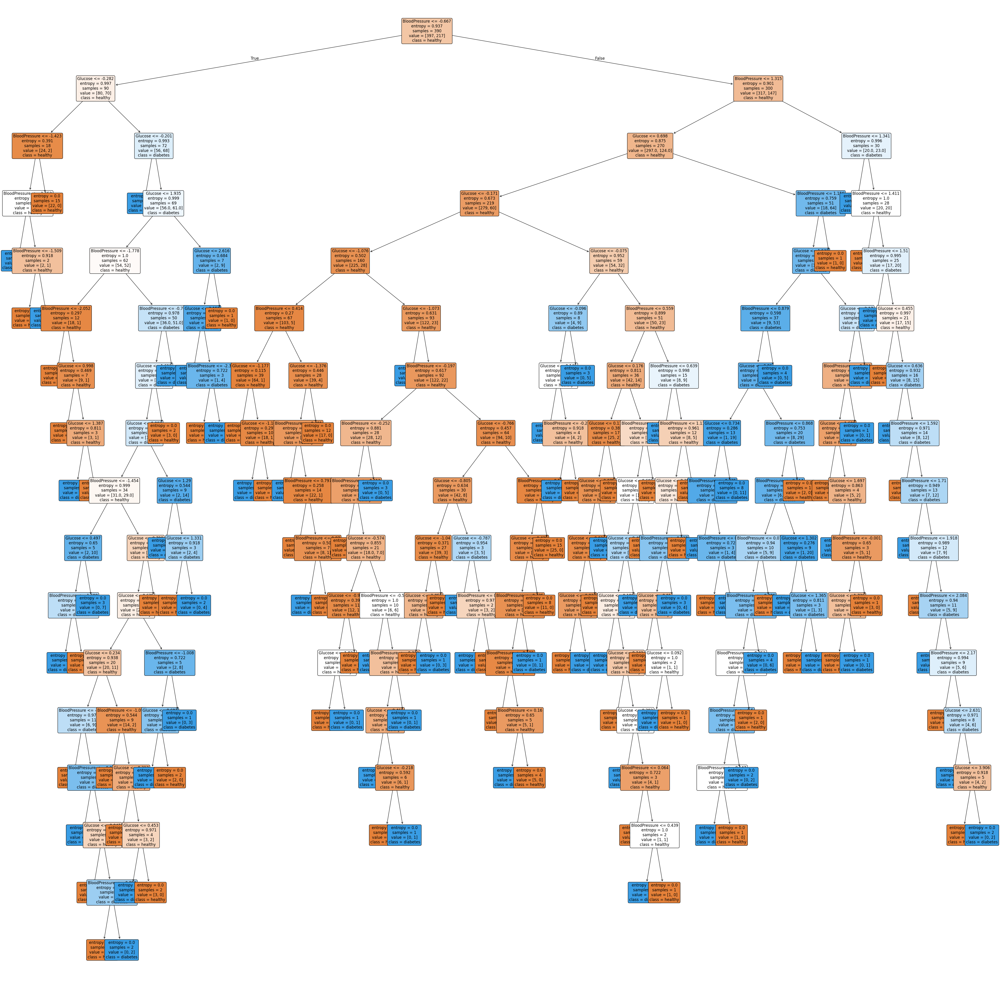

In [74]:
chosen_tree=rtf.estimators_[0]
plt.figure(figsize=(55,55))
plot_tree(chosen_tree,feature_names=X.columns, filled=True, rounded=True, class_names=['healthy', 'diabetes'],
          fontsize=12)
plt.show()

In [75]:
#website to predict whether the person is healthy or having diabetes

In [76]:
from flask import Flask, render_template, request
app=Flask(__name__,template_folder='diabetes-check-app')
@app.route('/',methods=['POST','GET'])
def home():
  try:
    prediction=""
    prediction1=""
    age1=None
    blood1=None
    glucose1=None
    insulin1=None
    if request.method=='POST':
      age=int(request.form.get('age'))
      if age<=20:
        raise ValueError('age should be greater then 20')
      bloodpressure=int(request.form.get('bloodpressure'))
      glucose= int(request.form.get('glucose'))
      insulin=int(request.form.get('insulin'))
      age1=f'Age: {age}'
      blood1=f'BloodPressure: {bloodpressure}'
      glucose1=f'Glucose: {glucose}'
      insulin1=f'Insulin: {insulin}'
      print('age: ',age)
      print('bloodpressure: ',bloodpressure)
      print('glucose: ',glucose)
      print('insulin: ',insulin)

      model=RandomForestClassifier(n_estimators=150,criterion='gini',max_depth=3,random_state=42)
      model.fit(X_train,y_train)
      ypred=model.predict([[bloodpressure,glucose,insulin,age]])
      print()
      print()
      if ypred==1:
        prediction='Diabetes'
        prediction1=f'result: {prediction}'
      else:
        prediction='Healthy'
        prediction1=f'Result: {prediction}'
  except ValueError as e:
    if request.method=='POST':
      age=int(request.form.get('age'))
      bloodpressure=int(request.form.get('bloodpressure'))
      glucose=int(request.form.get('glucose'))
      insulin=int(request.form.get('insulin'))
      prediction=""


      print('age: ',age)
      print('bloodpressure: ',bloodpressure)
      print('glucose: ',glucose)

      model=RandomForestClassifier(n_estimators=150,criterion='entropy',random_state=42)
      model.fit(X_train,y_train)
      ypred=model.predict([[glucose,bloodpressure,insulin,age]])

      print()
      print()
      if ypred==1:
        print(ypred)
        prediction='Diabetes'
        prediction1=f'Result: {prediction}'
      else:
        print(ypred)
        prediction='Healthy'
        prediction1=f'Result: {prediction}'
  return render_template('data.html',age=age1,blood=blood1,glucose=glucose1,insulin=insulin1,result=prediction,result1=prediction1)


if __name__ == '__main__':
  app.run()
  

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [08/Jan/2026 15:59:42] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [08/Jan/2026 15:59:42] "GET /favicon.ico HTTP/1.1" 404 -


age:  51
bloodpressure:  130
glucose:  90
insulin:  15


127.0.0.1 - - [08/Jan/2026 16:00:13] "POST / HTTP/1.1" 200 -


In [ ]:
#stacking - VotingClassifier, StackingClassifier

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier

In [ ]:
X=df.iloc[:,:-1]
y=df.iloc[:,-1]


In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
sd=StandardScaler()
X_train=sd.fit_transform(X_train)
X_test=sd.transform(X_test)

In [ ]:
lr=LogisticRegression(random_state=42)

In [ ]:
lr.fit(X_train,y_train)
ypred=lr.predict(X_test)

In [ ]:
svc=SVC(random_state=42)


In [ ]:
svc.fit(X_train,y_train)

,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide `.",False
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False


In [ ]:
ypred1=svc.predict(X_test)

In [ ]:
print('logistic regression prediction')
print(ypred)
print()
print('support vector classifier prediction')
print(ypred1)

logistic regression prediction
[0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 1 1 0 1 1 0 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 1 0 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]

support vector classifier prediction
[0 0 0 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0
 0 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


C:\Users\tonyr\AppData\Local\Temp\ipykernel_9192\711051050.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.countplot(x=ypred,palette=['blue','red'])


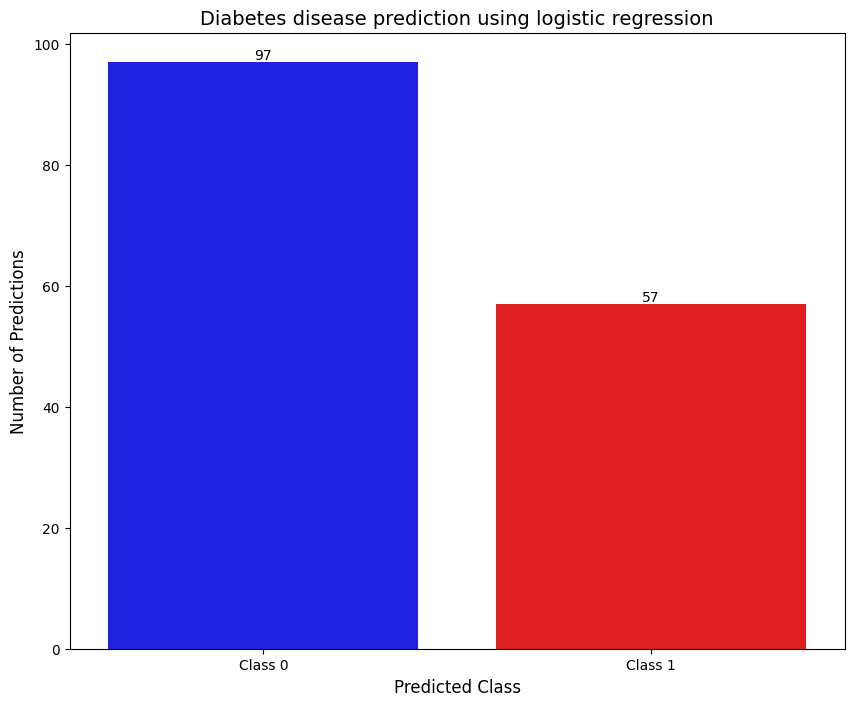

In [ ]:
#bar plot
plt.figure(figsize=(10,8))
ax=sns.countplot(x=ypred,palette=['blue','red'])
plt.title("Diabetes disease prediction using logistic regression", fontsize=14)
plt.xlabel('Predicted Class', fontsize=12)
plt.ylabel('Number of Predictions', fontsize=12)
plt.xticks([0,1],['Class 0', 'Class 1'])
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.show()

In [ ]:
print('accuracy score for values predicted by logistic regression',accuracy_score(y_test,ypred))
print('accuracy score for values predicted by support vector classifier',accuracy_score(y_test,ypred))

accuracy score for values predicted by logistic regression 0.7532467532467533
accuracy score for values predicted by support vector classifier 0.7532467532467533


In [ ]:
print('confusion matrix for values predicted by logistic regression')
print(confusion_matrix(y_test,ypred))
print('confusion matrix for values predicted by support vector machine')
print(confusion_matrix(y_test,ypred))

confusion matrix for values predicted by logistic regression
[[79 20]
 [18 37]]
confusion matrix for values predicted by support vector machine
[[79 20]
 [18 37]]


In [ ]:
voting_clf=VotingClassifier(estimators=[('lr',lr),('svm',svc)],voting='hard')

In [ ]:
voting_clf.fit(X_train,y_train)

,"estimators estimators: list of (str, estimator) tuplesInvoking the ``fit`` method on the ``VotingClassifier`` will fit clonesof those original estimators that will be stored in the class attribute``self.estimators_``. An estimator can be set to ``'drop'`` using:meth:`set_params`... versionchanged:: 0.21 ``'drop'`` is accepted. Using None was deprecated in 0.22 and support was removed in 0.24.","[('lr', ...), ('svm', ...)]"
,"voting voting: {'hard', 'soft'}, default='hard'If 'hard', uses predicted class labels for majority rule voting.Else if 'soft', predicts the class label based on the argmax ofthe sums of the predicted probabilities, which is recommended foran ensemble of well-calibrated classifiers.",'hard'
,"weights weights: array-like of shape (n_classifiers,), default=NoneSequence of weights (`float` or `int`) to weight the occurrences ofpredicted class labels (`hard` voting) or class probabilitiesbefore averaging (`soft` voting). Uses uniform weights if `None`.",None
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for ``fit``.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionadded:: 0.18",None
,"flatten_transform flatten_transform: bool, default=TrueAffects shape of transform output only when voting='soft'If voting='soft' and flatten_transform=True, transform method returnsmatrix with shape (n_samples, n_classifiers * n_classes). Ifflatten_transform=False, it returns(n_classifiers, n_samples, n_classes).",True
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting will be printed as itis completed... versionadded:: 0.23",False
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001


In [ ]:
ypred=voting_clf.predict(X_test)
print(ypred)

[0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0
 0 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [ ]:
print('voting classifier hard voting prediction',accuracy_score(y_test,ypred))

voting classifier hard voting prediction 0.7467532467532467


In [ ]:
results={'model':[],'accuracy':[]}
for name,clf in [('lr',lr),('svm',svc)]:
    ypred=voting_clf.predict(X_test)
    results['model'].append(name)
    results['accuracy'].append(accuracy_score(y_test,ypred))
#model names
print(results['model'])
#model accuracy score
print(results['accuracy'])
print()
df_results=pd.DataFrame(results)
print(df_results)

['lr', 'svm']
[0.7467532467532467, 0.7467532467532467]

  model  accuracy
0    lr  0.746753
1   svm  0.746753


C:\Users\tonyr\AppData\Local\Temp\ipykernel_9192\2651076131.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.countplot(x=ypred, palette=['blue','red'])


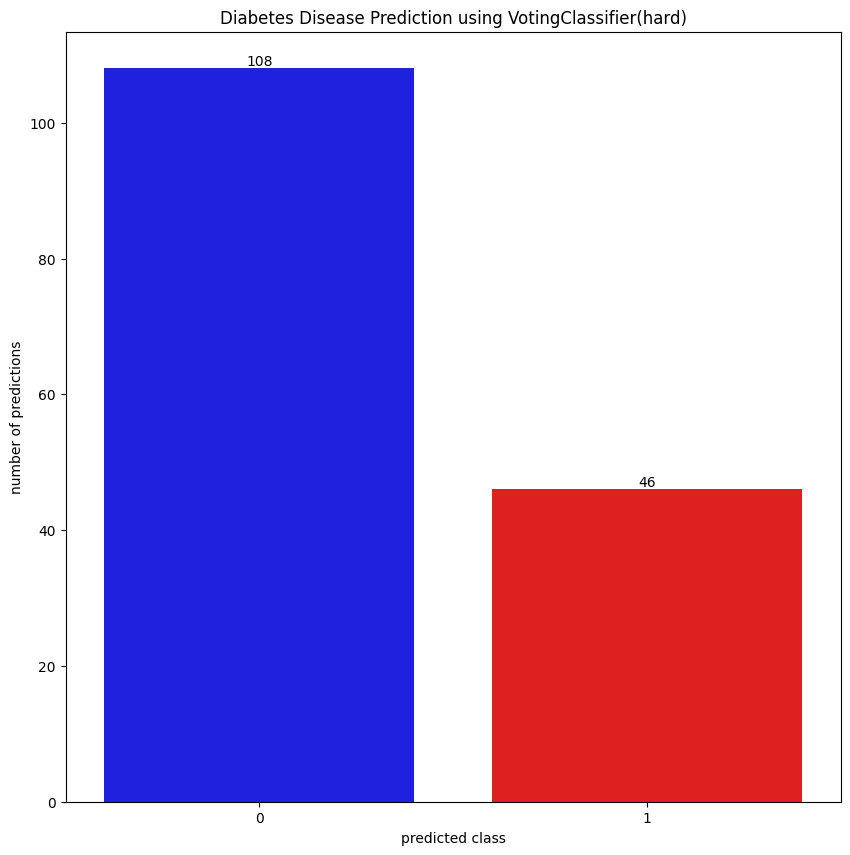

In [ ]:
plt.figure(figsize=(10,10))
ax=sns.countplot(x=ypred, palette=['blue','red'])
plt.title('Diabetes Disease Prediction using VotingClassifier(hard)')
plt.xlabel('predicted class')
plt.ylabel('number of predictions')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.show()

In [ ]:
#soft voting

In [ ]:
svc=SVC(probability=True, random_state=23)
voting_clf=VotingClassifier(estimators=[('lr',lr),('svm',svc)], voting='soft')

In [ ]:
voting_clf.fit(X_train,y_train)

,"estimators estimators: list of (str, estimator) tuplesInvoking the ``fit`` method on the ``VotingClassifier`` will fit clonesof those original estimators that will be stored in the class attribute``self.estimators_``. An estimator can be set to ``'drop'`` using:meth:`set_params`... versionchanged:: 0.21 ``'drop'`` is accepted. Using None was deprecated in 0.22 and support was removed in 0.24.","[('lr', ...), ('svm', ...)]"
,"voting voting: {'hard', 'soft'}, default='hard'If 'hard', uses predicted class labels for majority rule voting.Else if 'soft', predicts the class label based on the argmax ofthe sums of the predicted probabilities, which is recommended foran ensemble of well-calibrated classifiers.",'soft'
,"weights weights: array-like of shape (n_classifiers,), default=NoneSequence of weights (`float` or `int`) to weight the occurrences ofpredicted class labels (`hard` voting) or class probabilitiesbefore averaging (`soft` voting). Uses uniform weights if `None`.",None
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for ``fit``.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionadded:: 0.18",None
,"flatten_transform flatten_transform: bool, default=TrueAffects shape of transform output only when voting='soft'If voting='soft' and flatten_transform=True, transform method returnsmatrix with shape (n_samples, n_classifiers * n_classes). Ifflatten_transform=False, it returns(n_classifiers, n_samples, n_classes).",True
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting will be printed as itis completed... versionadded:: 0.23",False
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001


In [ ]:
ypred=voting_clf.predict(X_test)
print(ypred)

[0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 0 1 0 1 1 0 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [ ]:
print('voting classifier soft voting prediction',accuracy_score(y_test,ypred))

voting classifier soft voting prediction 0.7662337662337663


In [ ]:
results={'model':[],'accuracy':[]}
ypred=[]
for m,a in [('lr',lr),('svm',svc)]:
    ypred=clf.predict(X_test)
    results['model'].append(m)
    results['accuracy'].append(accuracy_score(y_test,ypred))

print(results['model'])
print(results['accuracy'])
print()



['lr', 'svm']
[0.7337662337662337, 0.7337662337662337]



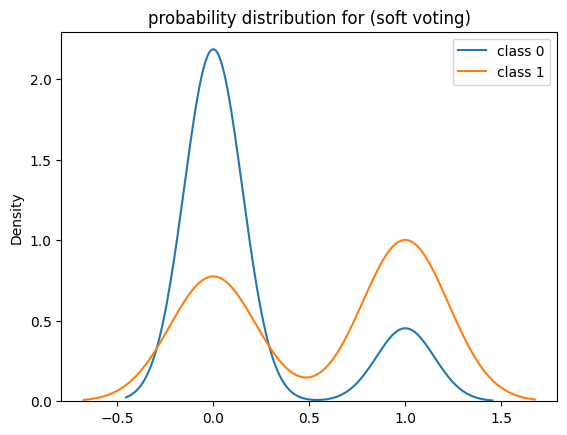

In [ ]:
#probability distribution of VotingClassifier (Soft voting)
sns.kdeplot(ypred[y_test==0],label='class 0')
sns.kdeplot(ypred[y_test==1],label='class 1')
plt.legend()
plt.title('probability distribution for (soft voting)')
plt.show()

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
#meta data algorithm

In [ ]:
base_models=[('lr',lr),('svm',svc)]

In [ ]:
meta_model=LogisticRegression(random_state=42)

In [ ]:
sv=StackingClassifier(estimators=base_models,final_estimator=meta_model,cv=5)

In [ ]:
sv.fit(X_train,y_train)

,"estimators estimators: list of (str, estimator)Base estimators which will be stacked together. Each element of thelist is defined as a tuple of string (i.e. name) and an estimatorinstance. An estimator can be set to 'drop' using `set_params`.The type of estimator is generally expected to be a classifier.However, one can pass a regressor for some use case (e.g. ordinalregression).","[('lr', ...), ('svm', ...)]"
,"final_estimator final_estimator: estimator, default=NoneA classifier which will be used to combine the base estimators.The default classifier is a:class:`~sklearn.linear_model.LogisticRegression`.",LogisticRegre...ndom_state=42)
,"cv cv: int, cross-validation generator, iterable, or ""prefit"", default=NoneDetermines the cross-validation splitting strategy used in`cross_val_predict` to train `final_estimator`. Possible inputs forcv are:* None, to use the default 5-fold cross validation,* integer, to specify the number of folds in a (Stratified) KFold,* An object to be used as a cross-validation generator,* An iterable yielding train, test splits,* `""prefit""`, to assume the `estimators` are prefit. In this case, the estimators will not be refitted.For integer/None inputs, if the estimator is a classifier and y iseither binary or multiclass,:class:`~sklearn.model_selection.StratifiedKFold` is used.In all other cases, :class:`~sklearn.model_selection.KFold` is used.These splitters are instantiated with `shuffle=False` so the splitswill be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here.If ""prefit"" is passed, it is assumed that all `estimators` havebeen fitted already. The `final_estimator_` is trained on the `estimators`predictions on the full training set and are **not** cross validatedpredictions. Please note that if the models have been trained on the samedata to train the stacking model, there is a very high risk of overfitting... versionadded:: 1.1 The 'prefit' option was added in 1.1.. note:: A larger number of split will provide no benefits if the number of training samples is large enough. Indeed, the training time will increase. ``cv`` is not used for model evaluation but for prediction.",5
,"stack_method stack_method: {'auto', 'predict_proba', 'decision_function', 'predict'}, default='auto'Methods called for each base estimator. It can be:* if 'auto', it will try to invoke, for each estimator, `'predict_proba'`, `'decision_function'` or `'predict'` in that order.* otherwise, one of `'predict_proba'`, `'decision_function'` or `'predict'`. If the method is not implemented by the estimator, it will raise an error.",'auto'
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for `fit` of all `estimators`.`None` means 1 unless in a `joblib.parallel_backend` context. -1 meansusing all processors. See :term:`Glossary ` for more details.",None
,"passthrough passthrough: bool, default=FalseWhen False, only the predictions of estimators will be used astraining data for `final_estimator`. When True, the`final_estimator` is trained on the predictions as well as theoriginal training data.",False
,"verbose verbose: int, default=0Verbosity level.",0
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inv

In [ ]:
ypred=sv.predict(X_test)
print(ypred)

[0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 0 1 0 1 1 0 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [ ]:
print('stacking classifier prediction',accuracy_score(y_test,ypred))

stacking classifier prediction 0.7662337662337663


In [ ]:
knn=KNeighborsClassifier(n_neighbors=5)

In [ ]:
base_models=[('lr',lr),('svm',svc),('knn',knn)]

In [ ]:
meta_model=LogisticRegression(random_state=42)

In [ ]:
stacking_clf=StackingClassifier(estimators=base_models,final_estimator=meta_model,cv=5)

In [ ]:
stacking_clf.fit(X_train,y_train)

,"estimators estimators: list of (str, estimator)Base estimators which will be stacked together. Each element of thelist is defined as a tuple of string (i.e. name) and an estimatorinstance. An estimator can be set to 'drop' using `set_params`.The type of estimator is generally expected to be a classifier.However, one can pass a regressor for some use case (e.g. ordinalregression).","[('lr', ...), ('svm', ...), ...]"
,"final_estimator final_estimator: estimator, default=NoneA classifier which will be used to combine the base estimators.The default classifier is a:class:`~sklearn.linear_model.LogisticRegression`.",LogisticRegre...ndom_state=42)
,"cv cv: int, cross-validation generator, iterable, or ""prefit"", default=NoneDetermines the cross-validation splitting strategy used in`cross_val_predict` to train `final_estimator`. Possible inputs forcv are:* None, to use the default 5-fold cross validation,* integer, to specify the number of folds in a (Stratified) KFold,* An object to be used as a cross-validation generator,* An iterable yielding train, test splits,* `""prefit""`, to assume the `estimators` are prefit. In this case, the estimators will not be refitted.For integer/None inputs, if the estimator is a classifier and y iseither binary or multiclass,:class:`~sklearn.model_selection.StratifiedKFold` is used.In all other cases, :class:`~sklearn.model_selection.KFold` is used.These splitters are instantiated with `shuffle=False` so the splitswill be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here.If ""prefit"" is passed, it is assumed that all `estimators` havebeen fitted already. The `final_estimator_` is trained on the `estimators`predictions on the full training set and are **not** cross validatedpredictions. Please note that if the models have been trained on the samedata to train the stacking model, there is a very high risk of overfitting... versionadded:: 1.1 The 'prefit' option was added in 1.1.. note:: A larger number of split will provide no benefits if the number of training samples is large enough. Indeed, the training time will increase. ``cv`` is not used for model evaluation but for prediction.",5
,"stack_method stack_method: {'auto', 'predict_proba', 'decision_function', 'predict'}, default='auto'Methods called for each base estimator. It can be:* if 'auto', it will try to invoke, for each estimator, `'predict_proba'`, `'decision_function'` or `'predict'` in that order.* otherwise, one of `'predict_proba'`, `'decision_function'` or `'predict'`. If the method is not implemented by the estimator, it will raise an error.",'auto'
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for `fit` of all `estimators`.`None` means 1 unless in a `joblib.parallel_backend` context. -1 meansusing all processors. See :term:`Glossary ` for more details.",None
,"passthrough passthrough: bool, default=FalseWhen False, only the predictions of estimators will be used astraining data for `final_estimator`. When True, the`final_estimator` is trained on the predictions as well as theoriginal training data.",False
,"verbose verbose: int, default=0Verbosity level.",0
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1

In [ ]:
ypred=stacking_clf.predict(X_test)
print(ypred)

[0 0 0 0 1 0 0 1 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 0 1 0 1 1 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [ ]:
print('stacking classifier prediction',accuracy_score(y_test,ypred))

stacking classifier prediction 0.7467532467532467


In [ ]:
print(confusion_matrix(y_test,ypred))

[[82 17]
 [22 33]]


In [ ]:
stack_clf=StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=10)

In [ ]:
stack_clf.fit(X_train,y_train)
ypred=stack_clf.predict(X_test)
print(ypred)

[0 0 0 0 1 0 0 1 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 0 1 0 1 1 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]


In [ ]:
print('stacking classifier prediction',accuracy_score(y_test,ypred))

stacking classifier prediction 0.7467532467532467


C:\Users\tonyr\AppData\Local\Temp\ipykernel_9192\830729604.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ypred[y_test == 0], label='Actual Class 0', shade=True)
C:\Users\tonyr\AppData\Local\Temp\ipykernel_9192\830729604.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ypred[y_test == 1], label='Actual Class 1', shade=True)


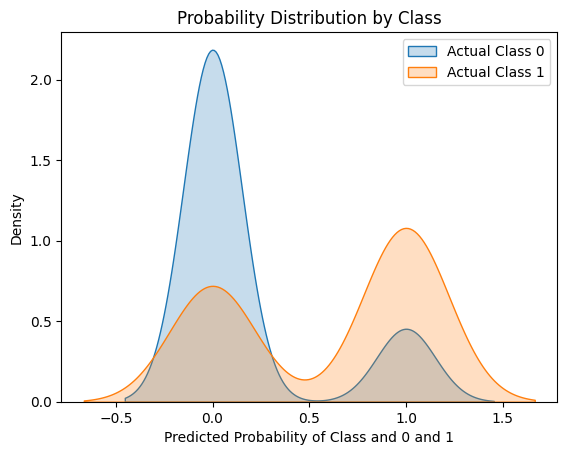

In [ ]:
sns.kdeplot(ypred[y_test == 0], label='Actual Class 0', shade=True)
sns.kdeplot(ypred[y_test == 1], label='Actual Class 1', shade=True)
plt.xlabel('Predicted Probability of Class and 0 and 1')
plt.title('Probability Distribution by Class')
plt.legend()
plt.show()